In [1]:
%load_ext autoreload
%autoreload 2


import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time


In [2]:
import shutil
import os 

In [5]:
train_inputImg = []
train_inputImg.append(pd.read_csv('./train_senior.csv', delimiter=','))

for csv_file in train_inputImg:
    for row in csv_file.values:
        img_landmarks = list(row)
        image = cv2.imread('./cepha400/cepha400/' + img_landmarks[0], 0)
        landmarks = []

        for i in range(1,38,2):
            x = img_landmarks[i]/1935*1024
            y = img_landmarks[i+1]/2400*1024
            landmarks.append(x)
            landmarks.append(y)

        image = cv2.resize(image, (1024,1024))

        cv2.imwrite('./Train/Images/'+img_landmarks[0].replace('.jpg', '.png'), image.astype('uint8'))
        np.save('./Train/landmarks/'+img_landmarks[0].replace('.jpg', '.npy'), landmarks)


val_inputImg = []
val_inputImg.append(pd.read_csv('./test1_senior.csv', delimiter=','))

for csv_file in val_inputImg:
    for row in csv_file.values:
        img_landmarks = list(row)
        image = cv2.imread('./cepha400/cepha400/' + img_landmarks[0], 0)
        landmarks = []

        for i in range(1,38,2):
            x = img_landmarks[i]/1935*1024
            y = img_landmarks[i+1]/2400*1024
            landmarks.append(x)
            landmarks.append(y)

        image = cv2.resize(image, (1024,1024))

        cv2.imwrite('./Val/Images/'+img_landmarks[0].replace('.jpg', '.png'), image.astype('uint8'))
        np.save('./Val/landmarks/'+img_landmarks[0].replace('.jpg', '.npy'), landmarks)
        

test_inputImg = []
test_inputImg.append(pd.read_csv('./test2_senior.csv', delimiter=','))

for csv_file in test_inputImg:
    for row in csv_file.values:
        img_landmarks = list(row)
        image = cv2.imread('./cepha400/cepha400/' + img_landmarks[0], 0)
        landmarks = []

        for i in range(1,38,2):
            x = img_landmarks[i]/1935*1024
            y = img_landmarks[i+1]/2400*1024
            landmarks.append(x)
            landmarks.append(y)

        image = cv2.resize(image, (1024,1024))

        cv2.imwrite('./Test/Images/'+img_landmarks[0].replace('.jpg', '.png'), image.astype('uint8'))
        np.save('./Test/landmarks/'+img_landmarks[0].replace('.jpg', '.npy'), landmarks)
        













In [3]:
import sys 
sys.path.append('../..')
from models.hybrid import Hybrid as Hybrid
from models.hybridSkip import Hybrid as Skip
from models.hybridDoubleSkip import Hybrid as DoubleSkip

import os 

import torch
from torchvision import transforms
import numpy as np

from utils.dataLoader import LandmarksDataset, ToTensor, Rescale
from sklearn.metrics import mean_squared_error
import scipy.sparse as sp
from utils.utils import scipy_to_torch_sparse, genMatrixesLH, genMatrixesOne

In [4]:
train_path = "../../Datasets/Cephalometric/Train"



img_path = os.path.join(train_path, 'Images')
label_path = os.path.join(train_path, 'landmarks')
test_dataset = LandmarksDataset(img_path=img_path,
                                 label_path=label_path,
                                 transform = transforms.Compose([
                                             Rescale(1024),
                                             ToTensor()])
                                 )

device = 'cpu'

In [5]:
def draw_lines(ax, array, color = 'b'):
    N = array.shape[0]
    
    for i in range(0, N):
        x1, y1 = array[i-1,:]
        x2, y2 = array[i,:]
        
        ax.plot([x1, x2], [y1, y2], color=color, linestyle='-', linewidth=1)
    return

def draw_organ(ax, array, color = 'b', bigger = None):
    N = array.shape[0]
    
    for i in range(0, N):
        x, y = array[i,:]
        
        if bigger is not None:
            if i in bigger:
                circ = plt.Circle((x, y), radius=9, color=color, fill = True)
                ax.add_patch(circ)
                circ = plt.Circle((x, y), radius=3, color='white', fill = True)
            else:
                circ = plt.Circle((x, y), radius=3, color=color, fill = True)
        else:
            circ = plt.Circle((x, y), radius=3, color=color, fill = True)
            
        ax.add_patch(circ)
    return

def drawOrgans(ax, vector, title = '', img =  None):
    
    vector = vector.reshape(-1, 1)
    right_lung = vector[:19*2].reshape(-1,2)
    
    if img is not None:
        plt.imshow(img, cmap='gray')
    
    #ax.set_ylim(1024, 0)
    #ax.set_xlim(0, 1024)
    #fig.gca().set_aspect('equal', adjustable='box')
    
    draw_lines(ax, right_lung, 'r')
    
    draw_organ(ax, right_lung, 'r')

    ax.set_title(title)
    
    return

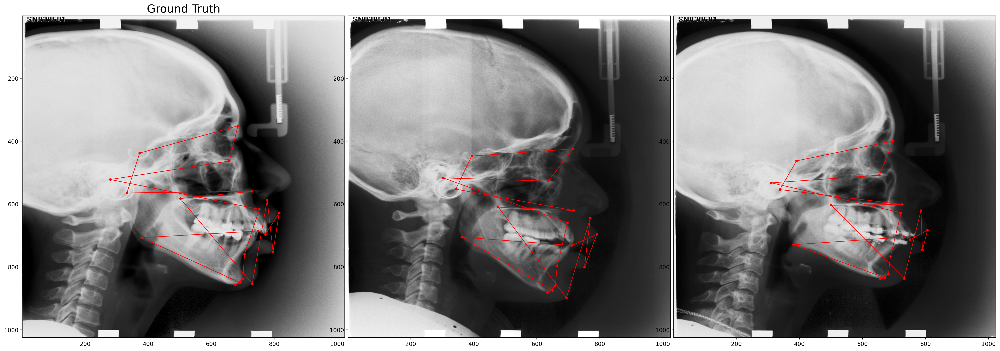

In [6]:
#from utils.fun import drawOrgans
import matplotlib.pyplot as plt

#model_list_ = [pcaNet, vae, hybrid, Skip6, double65]
#model_names_ = ['PCA', 'FC', 'HybridGNet', '1-IGSC Layer 6', '2-IGSC Layers 6-5']

i_ =[4, 13, 44]

fig = plt.figure(figsize=(24, 8), dpi= 200)

c = 0

for i in i_:
    with torch.no_grad():
        sample = test_dataset[i]

        data, target = sample['image'], sample['landmarks']
        data = torch.unsqueeze(data, 0).to(device)
        target = target.reshape(-1).numpy()

        draw = data.cpu().numpy()[0,0,:,:]
        
        ax = plt.subplot(1, 3, c+1)
        # 3, 8, 1+ c*8
        plt.axis('on')
        plt.xlim(1, 1024)
        plt.ylim(1024, 1)
        
        target = np.clip(target, 0, 1)
        if c == 0:
            drawOrgans(ax, target[:38] * 1024, None, draw.copy())
            plt.title("Ground Truth", fontsize = 20)
        else:
            drawOrgans(ax, target[:38] * 1024, None, draw.copy())
        
        c += 1
        
fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.01, hspace=0)      

In [40]:
A, AD, D, U = genMatrixesOne(19)

A = sp.csc_matrix(A).tocoo()
AD = sp.csc_matrix(AD).tocoo()
D = sp.csc_matrix(D).tocoo()
U = sp.csc_matrix(U).tocoo()

D_ = [D.copy()]
U_ = [U.copy()]
A_ = [A.copy(), A.copy(), A.copy(), AD.copy(), AD.copy(), AD.copy()]

N1 = A.shape[0]
N2 = AD.shape[0]

config = {}
config['n_nodes'] = config['n_nodes'] = [N1, N1, N1, N2, N2, N2]

A_t, D_t, U_t = ([scipy_to_torch_sparse(x).to(device) for x in X] for X in (A_, D_, U_))

config['latents'] = 64
config['inputsize'] = 1024

f = 32
config['filters'] = [2, f, f, f, f//2, f//2, f//2]
config['skip_features'] = f

config['window'] = (3,3)

config['K'] = 6
config['l1'] = 6
config['l2'] = 5

double = DoubleSkip(config.copy(), D_t, U_t, A_t).to(device)
double.load_state_dict(torch.load("/home/hpcpin1/Seg_Project/Training/cephalo_28071330/bestMSE.pt", map_location=device))
double.eval()
print('Model loaded')

6-5
Model loaded


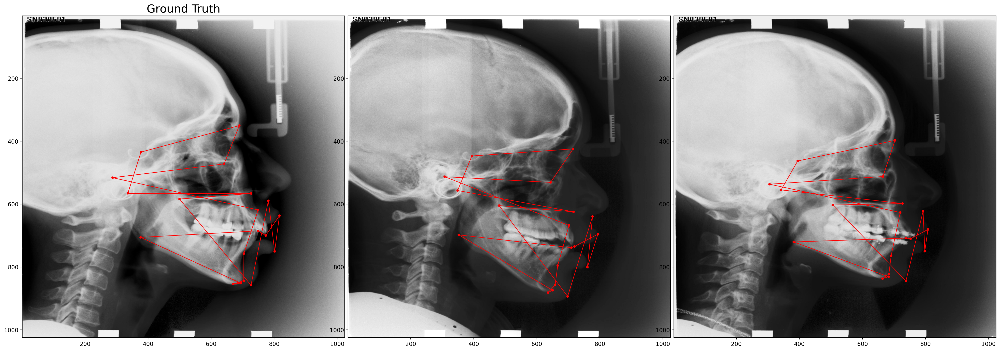

In [41]:
#from utils.fun import drawOrgans
import matplotlib.pyplot as plt

#model_list_ = [pcaNet, vae, hybrid, Skip6, double65]
#model_names_ = ['PCA', 'FC', 'HybridGNet', '1-IGSC Layer 6', '2-IGSC Layers 6-5']

i_ =[4, 13, 44]

fig = plt.figure(figsize=(24, 8), dpi= 200)

c = 0

for i in i_:
    with torch.no_grad():
        sample = test_dataset[i]

        data, target = sample['image'], sample['landmarks']
        data = torch.unsqueeze(data, 0).to(device)
        target = target.reshape(-1).numpy()

        draw = data.cpu().numpy()[0,0,:,:]
        
        ax = plt.subplot(1, 3, c+1)
        # 3, 8, 1+ c*8
        plt.axis('on')
        plt.xlim(1, 1024)
        plt.ylim(1024, 1)
        
        target = np.clip(target, 0, 1)

        output = double(data)
        if len(output) > 1:
            output = output[0]
        output = output.cpu().numpy().reshape(-1) 
        output = np.clip(output, 0, 1)[:240]

        target=output
        if c == 0:
            drawOrgans(ax, target[:38] * 1024, None, draw.copy())
            plt.title("Ground Truth", fontsize = 20)
        else:
            drawOrgans(ax, target[:38] * 1024, None, draw.copy())
        
        c += 1
        
fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.01, hspace=0)      

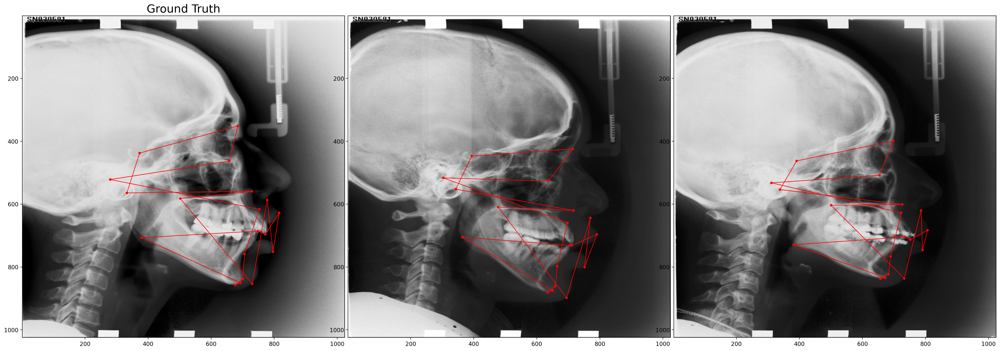

In [42]:
#from utils.fun import drawOrgans
import matplotlib.pyplot as plt

#model_list_ = [pcaNet, vae, hybrid, Skip6, double65]
#model_names_ = ['PCA', 'FC', 'HybridGNet', '1-IGSC Layer 6', '2-IGSC Layers 6-5']

i_ =[4, 13, 44]

fig = plt.figure(figsize=(24, 8), dpi= 200)

c = 0

for i in i_:
    with torch.no_grad():
        sample = test_dataset[i]

        data, target = sample['image'], sample['landmarks']
        data = torch.unsqueeze(data, 0).to(device)
        target = target.reshape(-1).numpy()

        draw = data.cpu().numpy()[0,0,:,:]
        
        ax = plt.subplot(1, 3, c+1)
        # 3, 8, 1+ c*8
        plt.axis('on')
        plt.xlim(1, 1024)
        plt.ylim(1024, 1)
        
        target = np.clip(target, 0, 1)

        if c == 0:
            drawOrgans(ax, target[:38] * 1024, None, draw.copy())
            plt.title("Ground Truth", fontsize = 20)
        else:
            drawOrgans(ax, target[:38] * 1024, None, draw.copy())
        
        c += 1
        
fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.01, hspace=0)      